In [1]:
import os
import glob as glob
import timecorr as tc
import hypertools as hyp
import numpy as np
import pandas as pd
from scipy.io import loadmat
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline  
import timecorr as tc
from timecorr.helpers import isfc, wisfc, mean_combine, corrmean_combine


In [2]:
from timecorr.helpers import vec2mat

In [3]:
# S = 2
# T = 200
# K = 20
# B = 5

# # define your weights parameters
# width = 5
# laplace = {'name': 'Laplace', 'weights': tc.laplace_weights, 'params': {'scale': width}}

# # calculate the dynamic correlation of the two datasets

# subs_data = tc.simulate_data(datagen='ramping', return_corrs=False, set_random_seed=True, S=S, T=T, K=K, B=B)


# wcorred_data = tc.wcorr(np.array(subs_data[0]),  np.array(subs_data[1]), weights=laplace['weights'](T))

In [4]:
# gif_path = '/Users/lucyowen/Desktop/tc_gif_2'

# for i in range(0,(wcorred_data).shape[2],1):
    
# #for i in range(0,2):
    
        
#         #currmat = vec2mat(tc_data[i,:])
#         currmat = wcorred_data[:, :, i]

#         sns.set(style="white")

#         # Set up the matplotlib figure
#         f, ax = plt.subplots(figsize=(11, 9))
        
#         # Generate a custom diverging colormap
#         cmap = sns.diverging_palette(220, 10, as_cmap=True)
        
#         sns.heatmap(currmat, cmap=cmap, vmin=-.1, vmax=.1, center=0,
#                     square=True, linewidths=.5, cbar_kws={"shrink": .5})
#         #ax.text(70,10, str(i),size=40)
#         outfile = os.path.join(gif_path, str(i).zfill(6) + '.png')
#         plt.savefig(outfile)

In [5]:
datadir = os.path.join(os.getenv('HOME'), 'Desktop', 'timecorr_env', 'timecorr_paper', 'pieman', 'data')


In [6]:
figdir = '../figs'
if not os.path.exists(figdir):
    os.mkdir(figdir)

In [7]:
factors=100

In [8]:
if factors == 100:
    pieman_name = '../../data/pieman_ica100.mat'
else:
    pieman_name = '../../data/pieman_data.mat'

pieman_conds = ['intact', 'paragraph', 'word', 'rest']

In [9]:
pieman_data = loadmat(pieman_name)

In [10]:
debug = False

In [11]:
if debug:
    data = []
    conds = []
    for c in pieman_conds:
        next_data = list(map(lambda i: pieman_data[c][:, i][0][:30, :10], np.where(np.arange(pieman_data[c].shape[1]) != 3)[0]))
        data.extend(next_data)
        conds.extend([c]*len(next_data))
    del pieman_data

else:

    data = []
    conds = []
    for c in pieman_conds:
        if c == 'paragraph':
            if factors == 700:
                next_data = list(map(lambda i: pieman_data[c][:, i][0], np.where(np.arange(pieman_data[c].shape[1]) != 3)[0]))
            else:
                next_data = list(map(lambda i: pieman_data[c][:, i][0], np.where(np.arange(pieman_data[c].shape[1]) != 0)[0]))
        else:
            next_data = list(map(lambda i: pieman_data[c][:, i][0], np.arange(pieman_data[c].shape[1])))
        data.extend(next_data)
        conds.extend([c]*len(next_data))
    del pieman_data

In [12]:
data = np.array(data)
conds = np.array(conds)

In [13]:
tc_data = tc.timecorr(list(data[conds == 'intact']), weights_function=tc.gaussian_weights, weights_params={'var': 5}, rfun=None, combine=tc.helpers.corrmean_combine)

/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


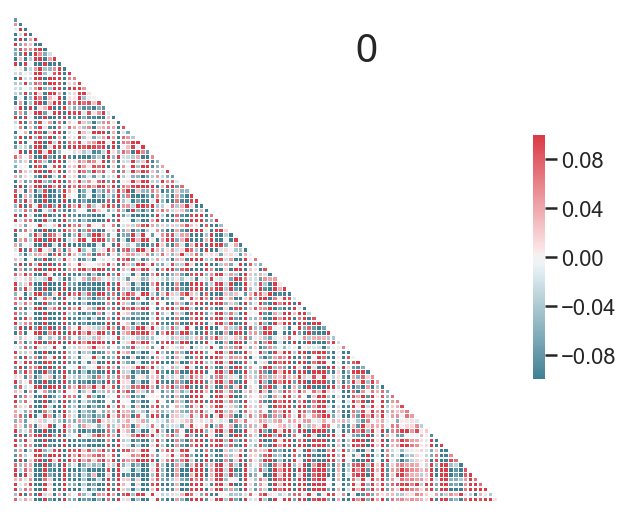

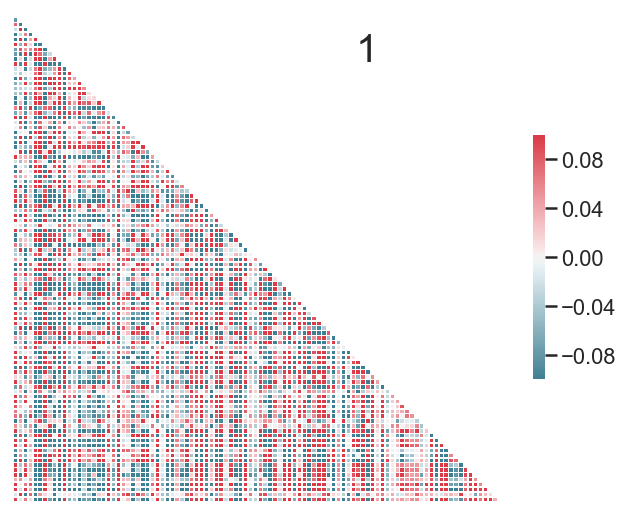

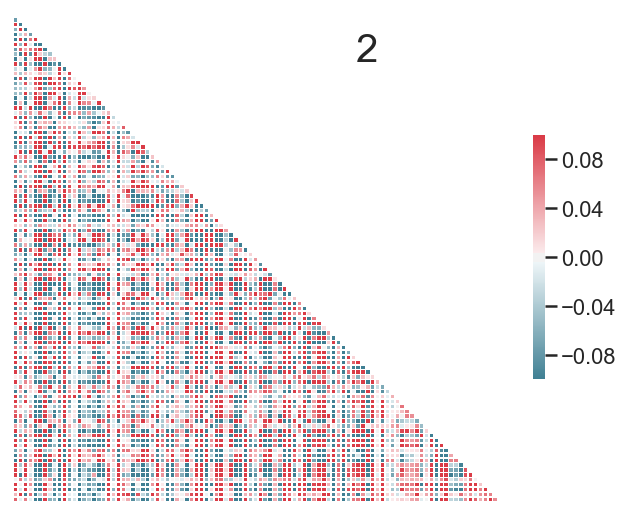

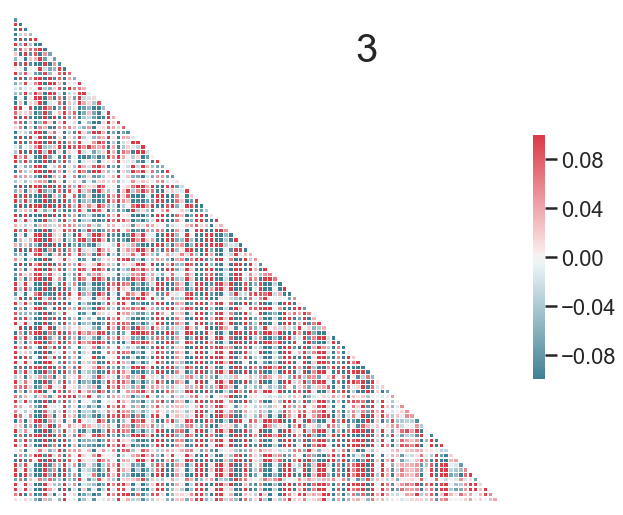

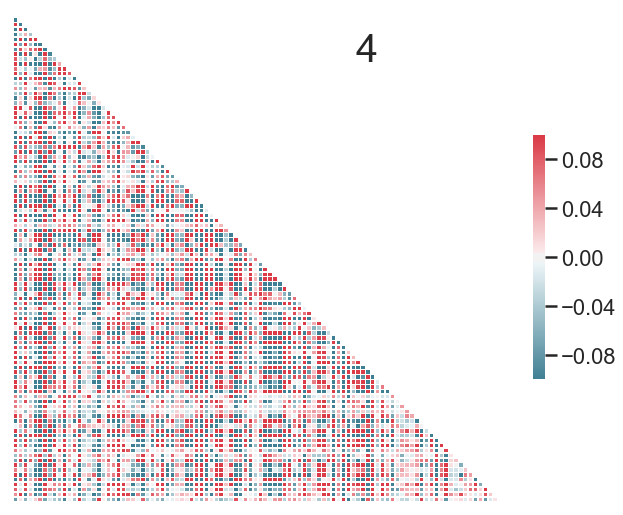

...

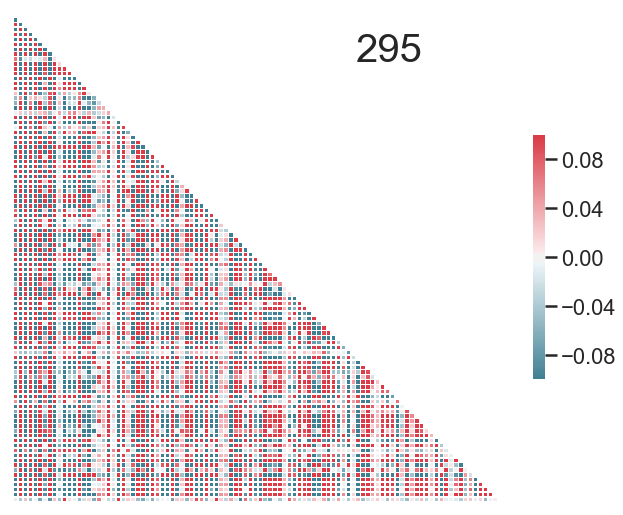

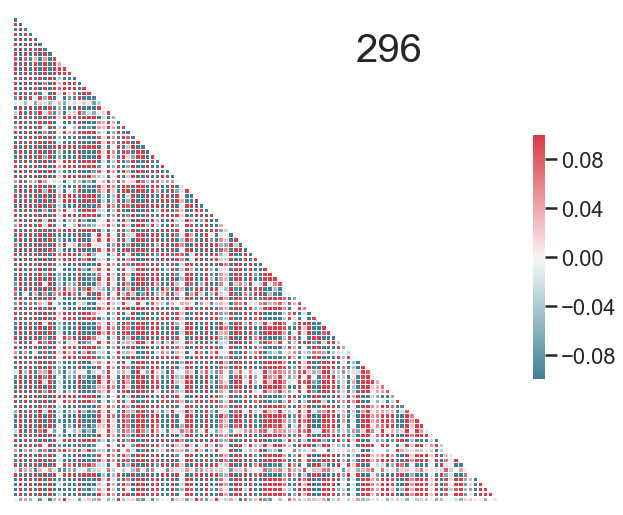

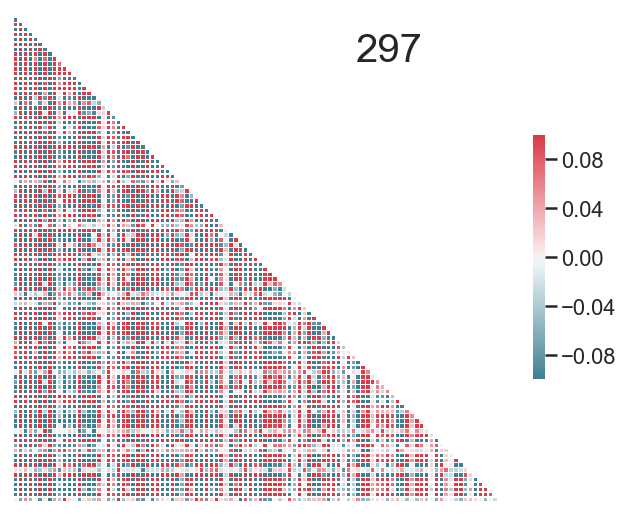

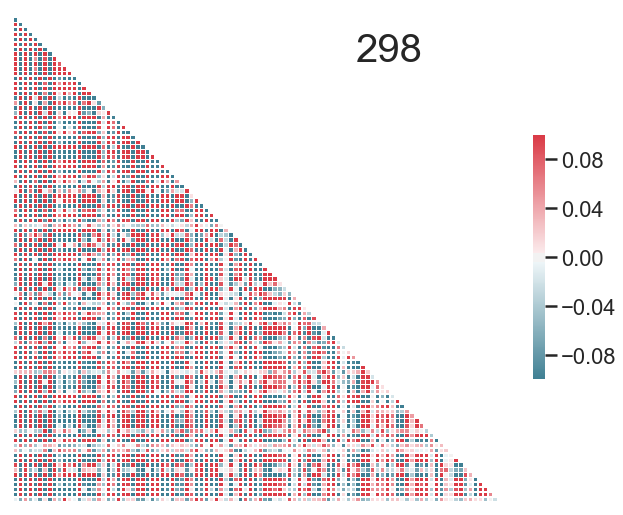

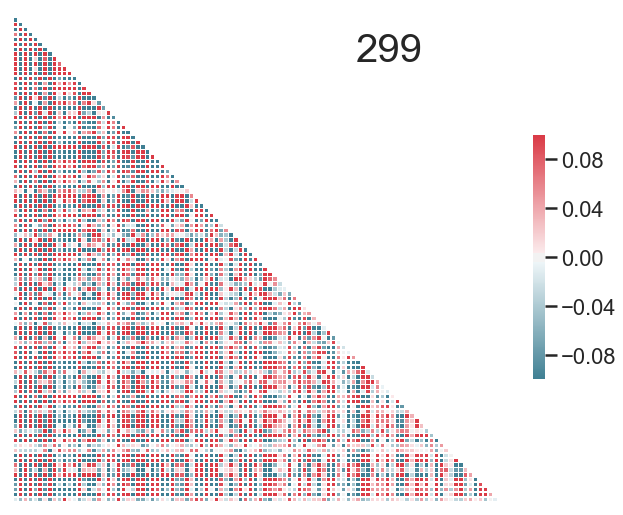

In [17]:
gif_path = '/Users/lucyowen/Desktop/tc_gif'

for i in range(0,(tc_data).shape[0],1):
    
#for i in range(0,2):
    

        currmat = vec2mat(tc_data[i,:])
        #labeled = pd.DataFrame(data = currmat, columns=latlocs['City'].as_matrix(), index=list(latlocs['City'].ravel()))        
        
        sns.set(style="white")

        # Generate a mask for the upper triangle
        mask = np.zeros_like(currmat, dtype=np.bool)
        mask[np.triu_indices_from(mask)] = True

        # Set up the matplotlib figure
        f, ax = plt.subplots(figsize=(11, 9))
        
        # Generate a custom diverging colormap
        cmap = sns.diverging_palette(220, 10, as_cmap=True)
        sns.set_context("poster")
        sns.heatmap(currmat, mask=mask, cmap=cmap, vmin=-.1, vmax=.1, center=0,
                    square=True, linewidths=.5, cbar_kws={"shrink": .5})
        ax.text(70,10, str(i),size=40)
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        outfile = os.path.join(gif_path, str(i).zfill(6) + '.png')
        plt.savefig(outfile)

In [15]:
gif_path = '/Users/lucyowen/Desktop/tc_gif'

In [18]:
# make the gif
import imageio
import os
name='100_factors'


images = []
for file in os.listdir(gif_path):
    if file.endswith(".png"):
        images.append(imageio.imread(os.path.join(gif_path, file)))

    
gif_outfile = os.path.join(gif_path, name + '.gif')  
imageio.mimsave(gif_outfile, images)
